# Insurance Claims- Fraud Detection

## Problem Statement:

### Business case:

Insurance fraud is a huge problem in the industry. It's difficult to identify fraud claims. Machine Learning is in a unique position to help the Auto Insurance industry with this problem.

In this project, you are provided a dataset which has the details of the insurance policy along with the customer details. It also has the details of the accident on the basis of which the claims have been made. 

In this example, you will be working with some auto insurance data to demonstrate how you can create a predictive model that predicts if an insurance claim is fraudulent or not. 

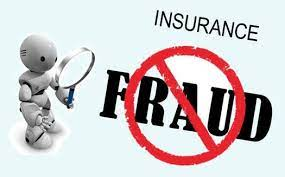

In [1]:
# Importing some neccessary liabraries which will help us to understand and visualize data

import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')

In [2]:
df=pd.read_csv(r'https://raw.githubusercontent.com/dsrscientist/Data-Science-ML-Capstone-Projects/master/Automobile_insurance_fraud.csv')
df

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,...,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,_c39
0,328,48,521585,17-10-2014,OH,250/500,1000,1406.91,0,466132,...,YES,71610,6510,13020,52080,Saab,92x,2004,Y,NaN
1,228,42,342868,27-06-2006,IN,250/500,2000,1197.22,5000000,468176,...,?,5070,780,780,3510,Mercedes,E400,2007,Y,NaN
2,134,29,687698,06-09-2000,OH,100/300,2000,1413.14,5000000,430632,...,NO,34650,7700,3850,23100,Dodge,RAM,2007,N,NaN
3,256,41,227811,25-05-1990,IL,250/500,2000,1415.74,6000000,608117,...,NO,63400,6340,6340,50720,Chevrolet,Tahoe,2014,Y,NaN
4,228,44,367455,06-06-2014,IL,500/1000,1000,1583.91,6000000,610706,...,NO,6500,1300,650,4550,Accura,RSX,2009,N,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,3,38,941851,16-07-1991,OH,500/1000,1000,1310.80,0,431289,...,?,87200,17440,8720,61040,Honda,Accord,2006,N,NaN
996,285,41,186934,05-01-2014,IL,100/300,1000,1436.79,0,608177,...,?,108480,18080,18080,72320,Volkswagen,Passat,2015,N,NaN
997,130,34,918516,17-02-2003,OH,250/500,500,1383.49,3000000,442797,...,YES,67500,7500,7500,52500,Suburu,Impreza,1996,N,NaN
998,458,62,533940,18-11-2011,IL,500/1000,2000,1356.92,5000000,441714,...,YES,46980,5220,5220,36540,Audi,A5,1998,N,NaN


In [3]:
df.shape

(1000, 40)

We have total 1000 rows and 40 huge range of columns

In [4]:
df.head()

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,...,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,_c39
0,328,48,521585,17-10-2014,OH,250/500,1000,1406.91,0,466132,...,YES,71610,6510,13020,52080,Saab,92x,2004,Y,NaN
1,228,42,342868,27-06-2006,IN,250/500,2000,1197.22,5000000,468176,...,?,5070,780,780,3510,Mercedes,E400,2007,Y,NaN
2,134,29,687698,06-09-2000,OH,100/300,2000,1413.14,5000000,430632,...,NO,34650,7700,3850,23100,Dodge,RAM,2007,N,NaN
3,256,41,227811,25-05-1990,IL,250/500,2000,1415.74,6000000,608117,...,NO,63400,6340,6340,50720,Chevrolet,Tahoe,2014,Y,NaN
4,228,44,367455,06-06-2014,IL,500/1000,1000,1583.91,6000000,610706,...,NO,6500,1300,650,4550,Accura,RSX,2009,N,NaN


In [5]:
df.tail()

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,...,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,_c39
995,3,38,941851,16-07-1991,OH,500/1000,1000,1310.80,0,431289,...,?,87200,17440,8720,61040,Honda,Accord,2006,N,NaN
996,285,41,186934,05-01-2014,IL,100/300,1000,1436.79,0,608177,...,?,108480,18080,18080,72320,Volkswagen,Passat,2015,N,NaN
997,130,34,918516,17-02-2003,OH,250/500,500,1383.49,3000000,442797,...,YES,67500,7500,7500,52500,Suburu,Impreza,1996,N,NaN
998,458,62,533940,18-11-2011,IL,500/1000,2000,1356.92,5000000,441714,...,YES,46980,5220,5220,36540,Audi,A5,1998,N,NaN
999,456,60,556080,11-11-1996,OH,250/500,1000,766.19,0,612260,...,?,5060,460,920,3680,Mercedes,E400,2007,N,NaN


* policy_csl column has some new kind of data which we need to covert in numeric format
* _c39 looks all columns blank so we can delete that column
* I see some question mark in police_report_available

In [6]:
# I am droping policy_number from data sent as it is always unique for all policies

df.drop("policy_number",axis=1,inplace=True)

In [7]:
df.sample(3)

,months_as_customer,age,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,insured_sex,...,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,_c39
269,195,36,06-11-2001,IN,100/300,2000,1346.18,0,611852,FEMALE,...,YES,68970,12540,6270,50160,Chevrolet,Tahoe,2007,N,NaN
767,253,46,19-04-2006,IL,100/300,500,1358.20,0,477636,FEMALE,...,NO,64570,5870,11740,46960,Jeep,Wrangler,2001,N,NaN
762,264,43,01-05-2010,IL,100/300,500,1508.12,6000000,433275,MALE,...,NO,60750,13500,6750,40500,Jeep,Wrangler,2015,Y,NaN


In [8]:
#Let us check the name of our columns
df.columns

Index(['months_as_customer', 'age', 'policy_bind_date', 'policy_state',
       'policy_csl', 'policy_deductable', 'policy_annual_premium',
       'umbrella_limit', 'insured_zip', 'insured_sex',
       'insured_education_level', 'insured_occupation', 'insured_hobbies',
       'insured_relationship', 'capital-gains', 'capital-loss',
       'incident_date', 'incident_type', 'collision_type', 'incident_severity',
       'authorities_contacted', 'incident_state', 'incident_city',
       'incident_location', 'incident_hour_of_the_day',
       'number_of_vehicles_involved', 'property_damage', 'bodily_injuries',
       'witnesses', 'police_report_available', 'total_claim_amount',
       'injury_claim', 'property_claim', 'vehicle_claim', 'auto_make',
       'auto_model', 'auto_year', 'fraud_reported', '_c39'],
      dtype='object')

In [9]:
df.duplicated().sum()

0

We can see above there is no duplicate raws are present in dataset

In [10]:
df.isnull().sum()

months_as_customer                0
age                               0
policy_bind_date                  0
policy_state                      0
policy_csl                        0
policy_deductable                 0
policy_annual_premium             0
umbrella_limit                    0
insured_zip                       0
insured_sex                       0
insured_education_level           0
insured_occupation                0
insured_hobbies                   0
insured_relationship              0
capital-gains                     0
capital-loss                      0
incident_date                     0
incident_type                     0
collision_type                    0
incident_severity                 0
authorities_contacted            91
incident_state                    0
incident_city                     0
incident_location                 0
incident_hour_of_the_day          0
number_of_vehicles_involved       0
property_damage                   0
bodily_injuries             

We can see that _c39 has 1000 null values that meansn not single data is present in dataset in this columns 

In [11]:
# Droping _c39

df.drop("_c39",axis=1,inplace=True)

<Axes: >

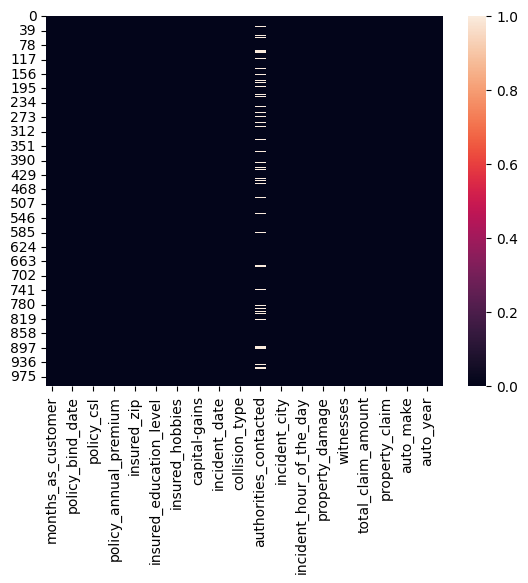

In [12]:
# Visaulize Null values on heatmap
sns.heatmap(df.isna())

Now we dont have any null values

In [13]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 38 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   months_as_customer           1000 non-null   int64  
 1   age                          1000 non-null   int64  
 2   policy_bind_date             1000 non-null   object 
 3   policy_state                 1000 non-null   object 
 4   policy_csl                   1000 non-null   object 
 5   policy_deductable            1000 non-null   int64  
 6   policy_annual_premium        1000 non-null   float64
 7   umbrella_limit               1000 non-null   int64  
 8   insured_zip                  1000 non-null   int64  
 9   insured_sex                  1000 non-null   object 
 10  insured_education_level      1000 non-null   object 
 11  insured_occupation           1000 non-null   object 
 12  insured_hobbies              1000 non-null   object 
 13  insured_relationshi

**Observation**

* Data is taking total 297KB of memory
* There are object values present in dataset
* As we delected null columns so there is no null values are present

In [14]:
df.nunique()

months_as_customer              391
age                              46
policy_bind_date                951
policy_state                      3
policy_csl                        3
policy_deductable                 3
policy_annual_premium           991
umbrella_limit                   11
insured_zip                     995
insured_sex                       2
insured_education_level           7
insured_occupation               14
insured_hobbies                  20
insured_relationship              6
capital-gains                   338
capital-loss                    354
incident_date                    60
incident_type                     4
collision_type                    4
incident_severity                 4
authorities_contacted             4
incident_state                    7
incident_city                     7
incident_location              1000
incident_hour_of_the_day         24
number_of_vehicles_involved       4
property_damage                   3
bodily_injuries             

We can see above how many unique values are present in each column. I can see that "incident_location" has total 1000 unique values present that means every value is unique so I will drop this column as our ML model will not be able to extract any insights from this columns

In [15]:
# Dropping "incident_location"

df.drop("incident_location",axis=1,inplace=True)

In [16]:
#Now Let us find the values of each Features in our data
for i in df.columns:
        print(df[i].value_counts())
        print('*'*100)

months_as_customer
194    8
128    7
254    7
140    7
210    7
      ..
390    1
411    1
453    1
448    1
17     1
Name: count, Length: 391, dtype: int64
****************************************************************************************************
age
43    49
39    48
41    45
34    44
38    42
30    42
31    42
37    41
33    39
40    38
32    38
29    35
46    33
42    32
35    32
36    32
44    32
28    30
26    26
45    26
48    25
47    24
27    24
57    16
25    14
55    14
49    14
53    13
50    13
24    10
54    10
61    10
51     9
60     9
58     8
56     8
23     7
21     6
59     5
62     4
52     4
64     2
63     2
19     1
20     1
22     1
Name: count, dtype: int64
****************************************************************************************************
policy_bind_date
01-01-2006    3
28-04-1992    3
05-08-1992    3
14-12-1991    2
09-08-2004    2
             ..
03-06-2014    1
12-12-1998    1
18-02-1999    1
30-10-1997    1
11-11-1996    1
Name

**Observation**

* collisison_type has "?" present
* Property_damage has "?" present 
* police_report_available "?: present

##### All above "?" we can represent with some meaning full name like "not_sure" ect

* Finally "fraud_reported" count of yes and no is imbalanced which we need to balance before train model

**Date formats**

* "policy_bind_date"
* "incident_date"

In [17]:
# First we will treat "?" by filling some word there just to have meaning 

df['collision_type']=df['collision_type'].replace("?","not_sure")

In [18]:
df['property_damage']=df['property_damage'].replace("?","not_sure")
df['police_report_available']=df['police_report_available'].replace("?","not_sure")


In [19]:
col=['collision_type','property_damage','police_report_available']

for i in col:
        print(df[i].value_counts())
        print('*'*100)

collision_type
Rear Collision     292
Side Collision     276
Front Collision    254
not_sure           178
Name: count, dtype: int64
****************************************************************************************************
property_damage
not_sure    360
NO          338
YES         302
Name: count, dtype: int64
****************************************************************************************************
police_report_available
not_sure    343
NO          343
YES         314
Name: count, dtype: int64
****************************************************************************************************


We have replaced "?"  now

### Lets treat date formats now

In [20]:
# Datetime for policy_bind_date
df['policy_bind_date']=pd.to_datetime(df['policy_bind_date'])
df['Month'] = pd.DatetimeIndex(df['policy_bind_date']).month
df['Year'] = pd.DatetimeIndex(df['policy_bind_date']).year
df['Day'] = df['policy_bind_date'].dt.day

In [21]:
# we will drop original "policy_bind_date" as we already extracted dates
df.drop(['policy_bind_date'],axis=1,inplace=True)
df

,months_as_customer,age,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,insured_sex,insured_education_level,...,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,Month,Year,Day
0,328,48,OH,250/500,1000,1406.91,0,466132,MALE,MD,...,6510,13020,52080,Saab,92x,2004,Y,10,2014,17
1,228,42,IN,250/500,2000,1197.22,5000000,468176,MALE,MD,...,780,780,3510,Mercedes,E400,2007,Y,6,2006,27
2,134,29,OH,100/300,2000,1413.14,5000000,430632,FEMALE,PhD,...,7700,3850,23100,Dodge,RAM,2007,N,9,2000,6
3,256,41,IL,250/500,2000,1415.74,6000000,608117,FEMALE,PhD,...,6340,6340,50720,Chevrolet,Tahoe,2014,Y,5,1990,25
4,228,44,IL,500/1000,1000,1583.91,6000000,610706,MALE,Associate,...,1300,650,4550,Accura,RSX,2009,N,6,2014,6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,3,38,OH,500/1000,1000,1310.80,0,431289,FEMALE,Masters,...,17440,8720,61040,Honda,Accord,2006,N,7,1991,16
996,285,41,IL,100/300,1000,1436.79,0,608177,FEMALE,PhD,...,18080,18080,72320,Volkswagen,Passat,2015,N,1,2014,5
997,130,34,OH,250/500,500,1383.49,3000000,442797,FEMALE,Masters,...,7500,7500,52500,Suburu,Impreza,1996,N,2,2003,17
998,458,62,IL,500/1000,2000,1356.92,5000000,441714,MALE,Associate,...,5220,5220,36540,Audi,A5,1998,N,11,2011,18


In [22]:
# Datetime for incident_date

df['incident_date']=pd.to_datetime(df['incident_date'])
df['incident_Month'] = pd.DatetimeIndex(df['incident_date']).month
df['incident_ear'] = pd.DatetimeIndex(df['incident_date']).year
df['incident_Day'] = df['incident_date'].dt.day


In [23]:
df['incident_ear'].value_counts()

incident_ear
2015    1000
Name: count, dtype: int64

In [24]:
# As Incisent_ear has only one year I will drop this columns 

df.drop('incident_ear',axis=1,inplace=True)

In [25]:
# Getting object data
object_datatype = []
for x in df.dtypes.index:
    if df.dtypes[x] == 'O':
        object_datatype.append(x)
print(f"Object Data Type Columns are:\n ",object_datatype)

# getting integers data
number_datatype = []
for x in df.dtypes.index:
    if df.dtypes[x] == 'float64' or df.dtypes[x] == 'int64':
        number_datatype.append(x)
print(f"\nNumber Data Type Columns are:\n ",number_datatype)

Object Data Type Columns are:
  ['policy_state', 'policy_csl', 'insured_sex', 'insured_education_level', 'insured_occupation', 'insured_hobbies', 'insured_relationship', 'incident_type', 'collision_type', 'incident_severity', 'authorities_contacted', 'incident_state', 'incident_city', 'property_damage', 'police_report_available', 'auto_make', 'auto_model', 'fraud_reported']

Number Data Type Columns are:
  ['months_as_customer', 'age', 'policy_deductable', 'policy_annual_premium', 'umbrella_limit', 'insured_zip', 'capital-gains', 'capital-loss', 'incident_hour_of_the_day', 'number_of_vehicles_involved', 'bodily_injuries', 'witnesses', 'total_claim_amount', 'injury_claim', 'property_claim', 'vehicle_claim', 'auto_year']


I have just separated columns on basis od Datatypes just because if required in visualization purpose

Single digit category column name: fraud_reported


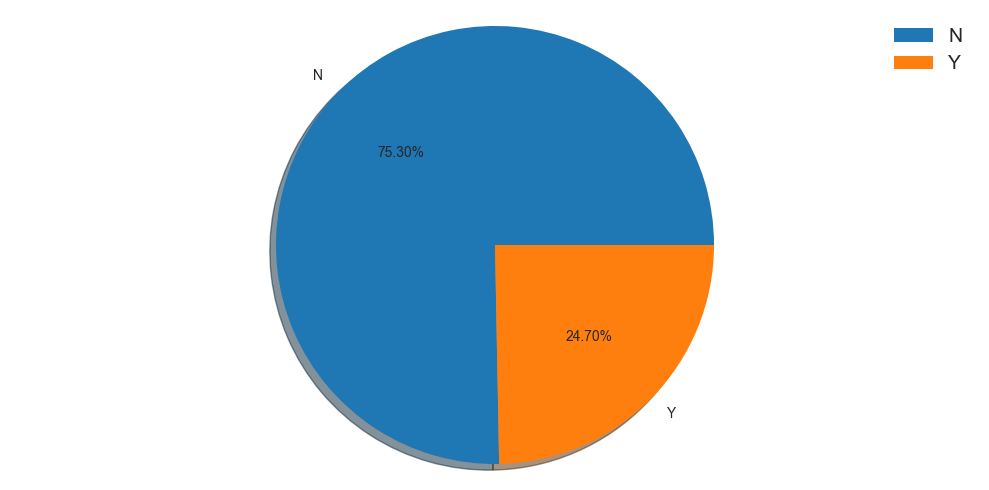

Single digit category column name: insured_sex


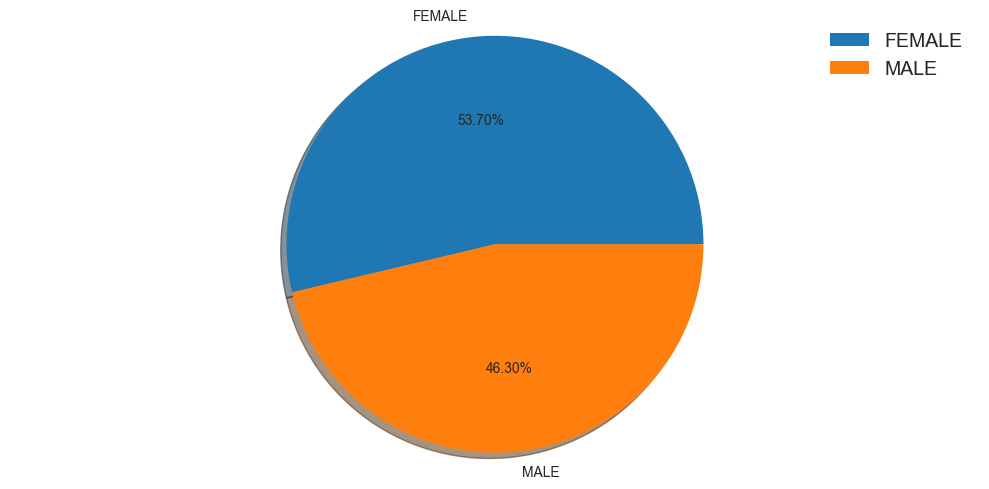

Single digit category column name: policy_state


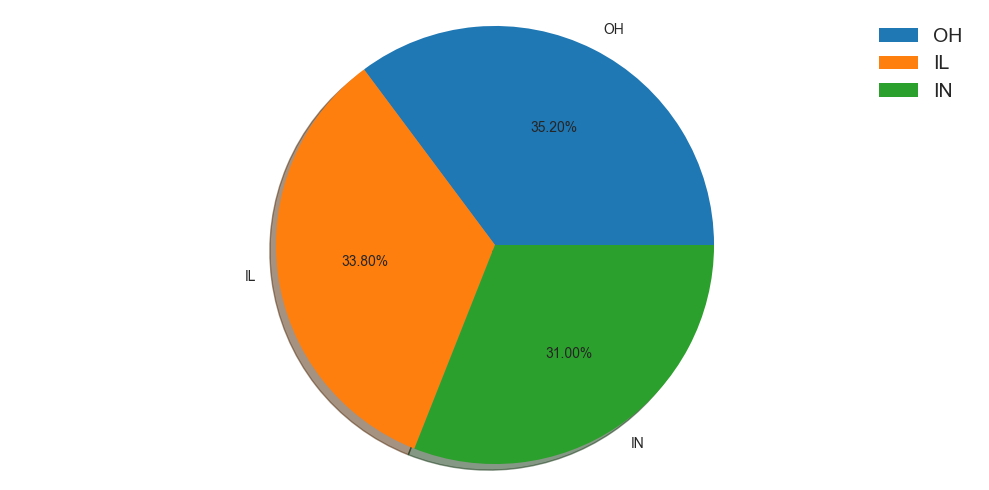

Single digit category column name: policy_csl


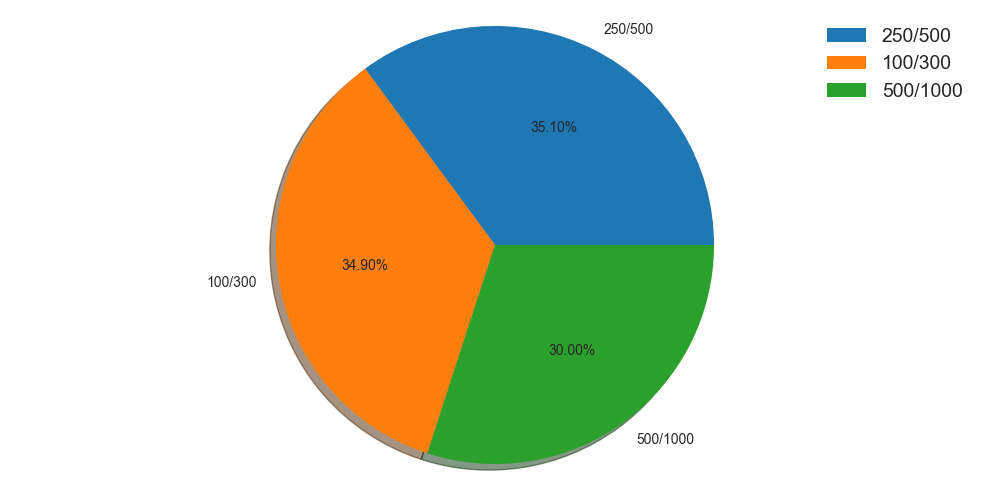

Single digit category column name: policy_deductable


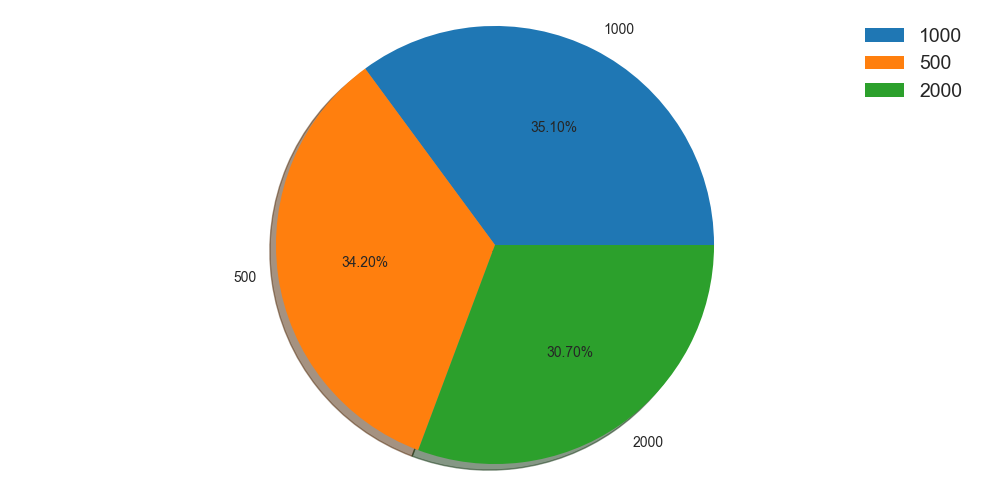

Single digit category column name: bodily_injuries


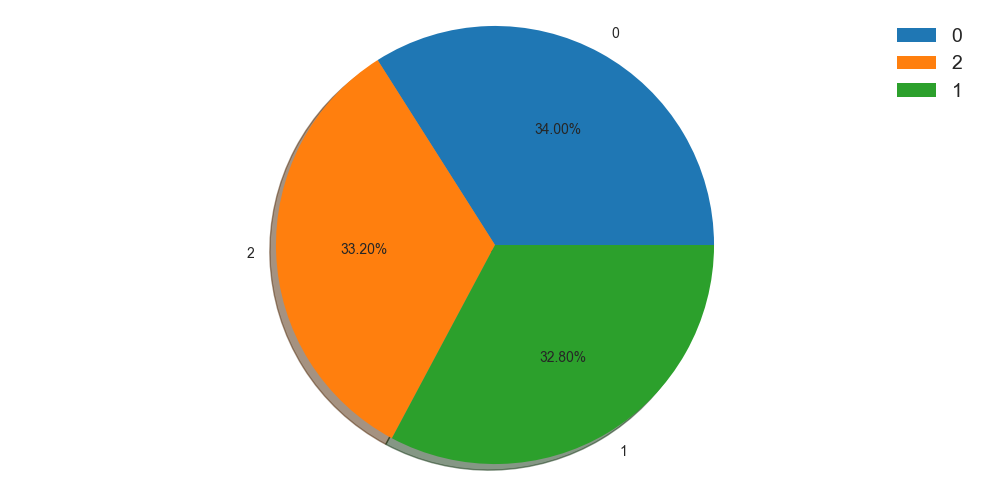

Single digit category column name: police_report_available


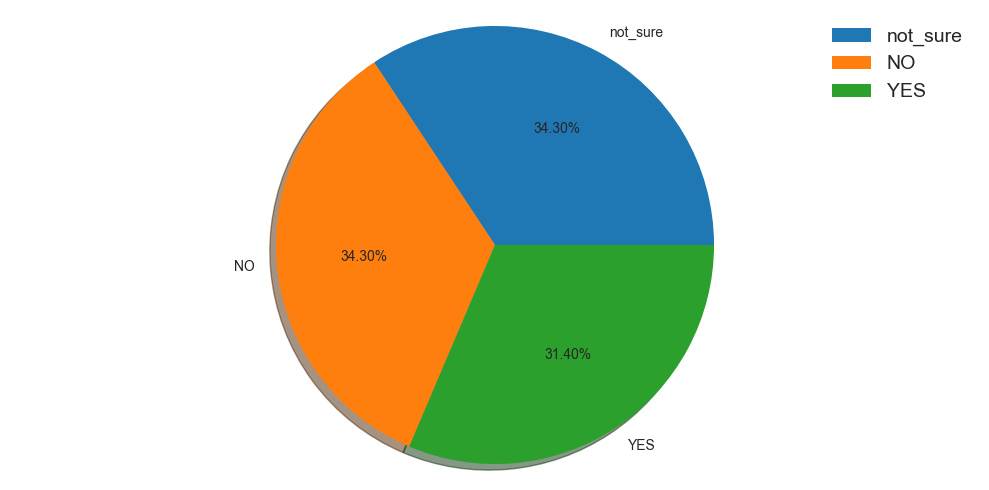

Single digit category column name: property_damage


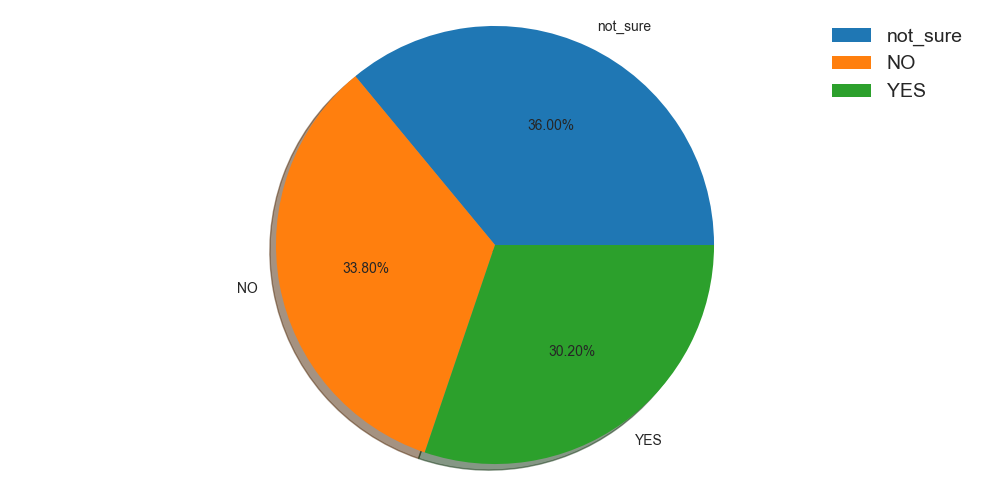

Single digit category column name: incident_type


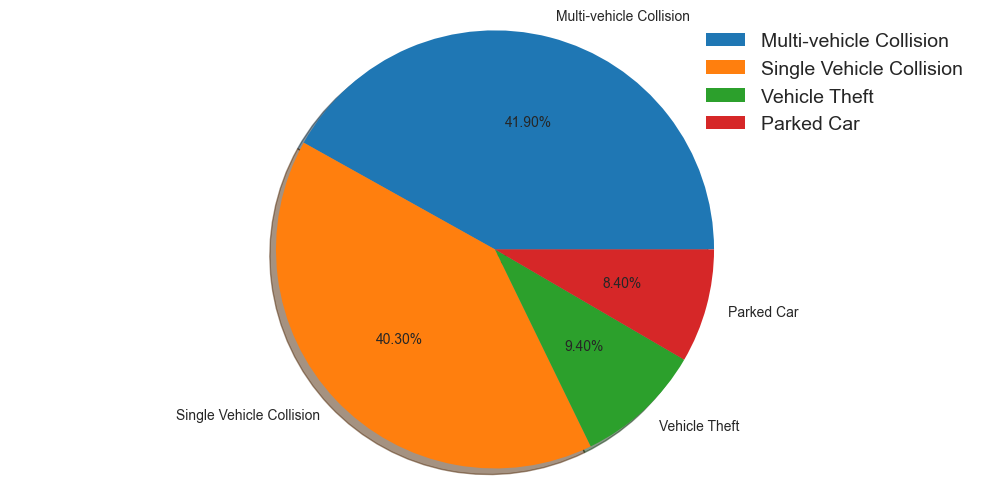

Single digit category column name: collision_type


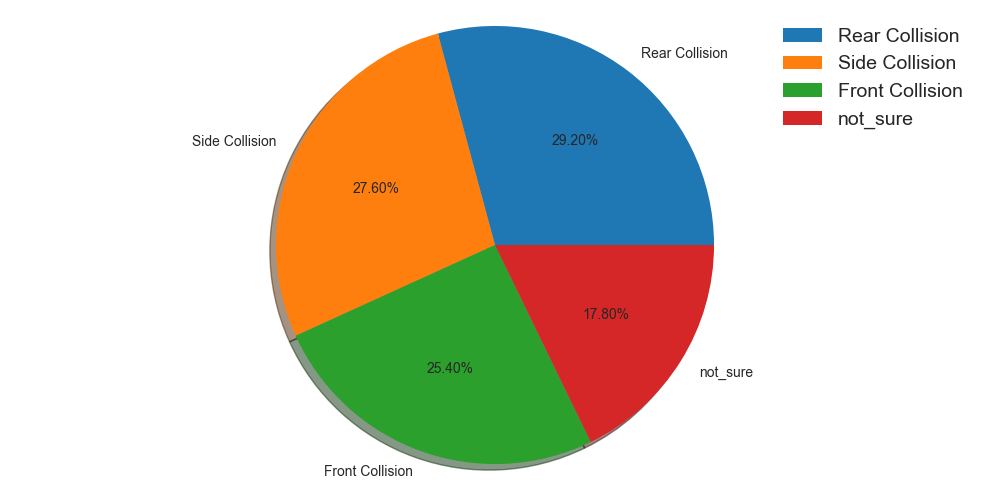

Single digit category column name: incident_severity


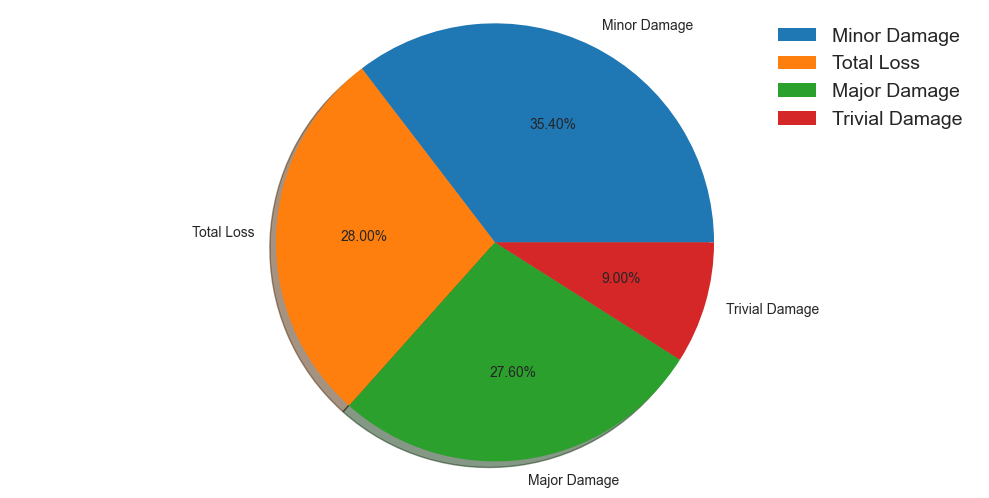

Single digit category column name: number_of_vehicles_involved


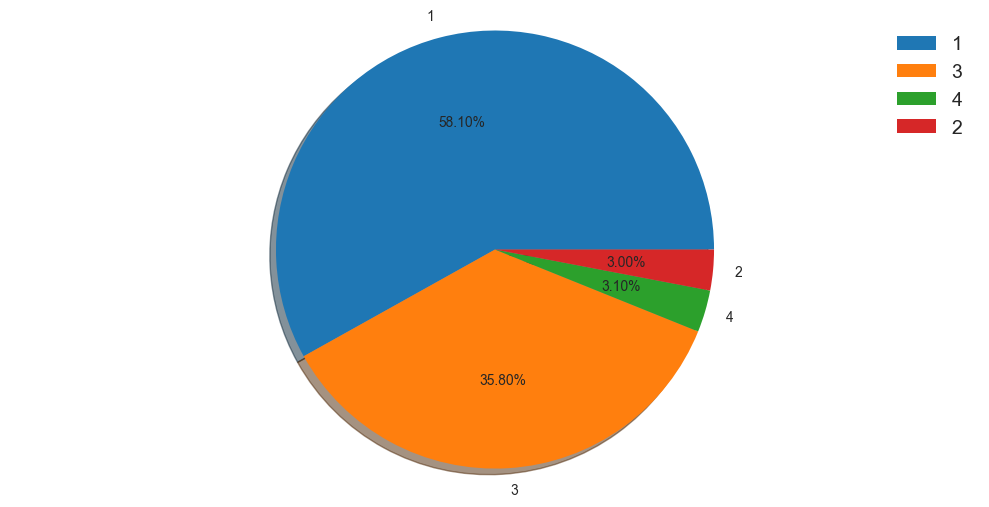

Single digit category column name: witnesses


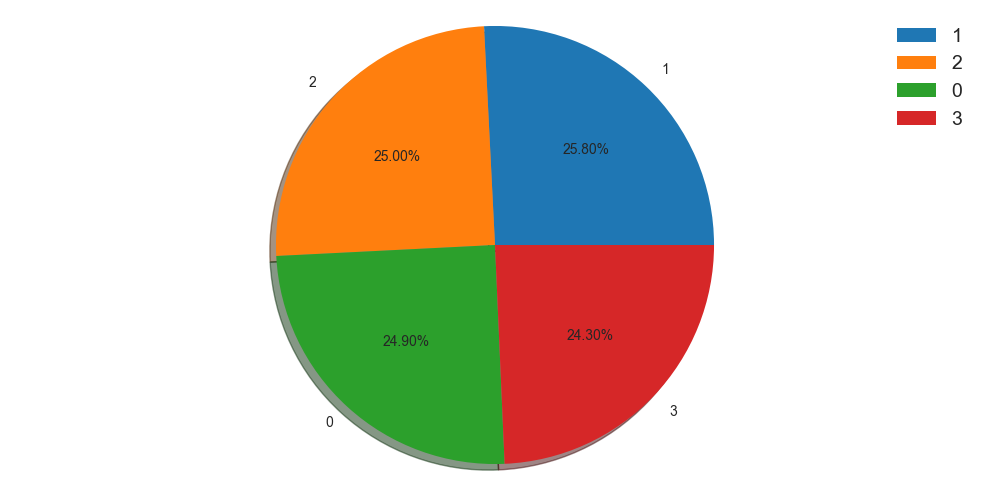

Single digit category column name: authorities_contacted


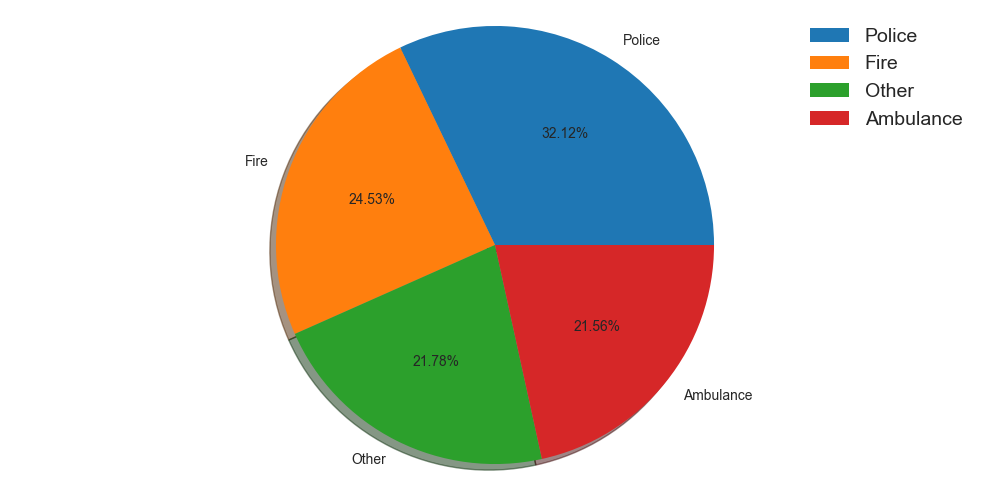

Single digit category column name: insured_relationship


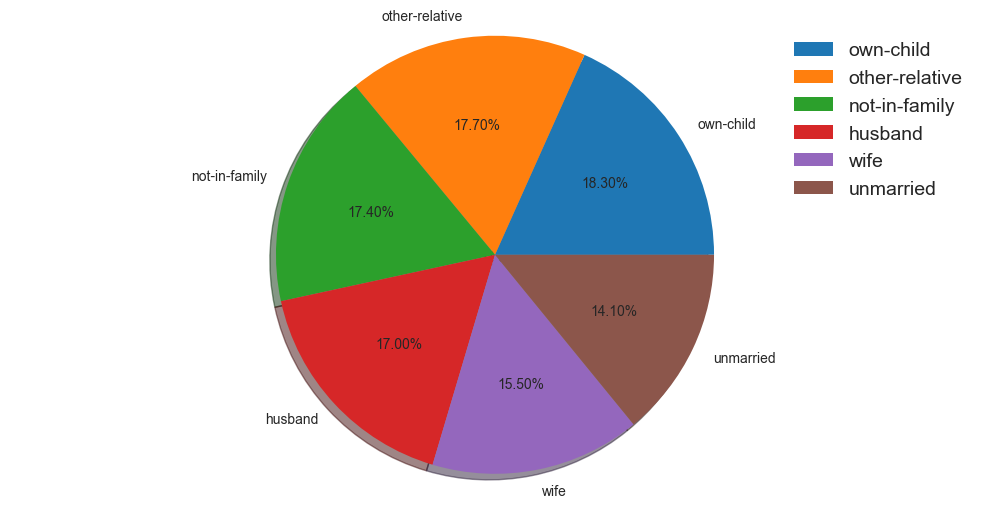

Single digit category column name: insured_education_level


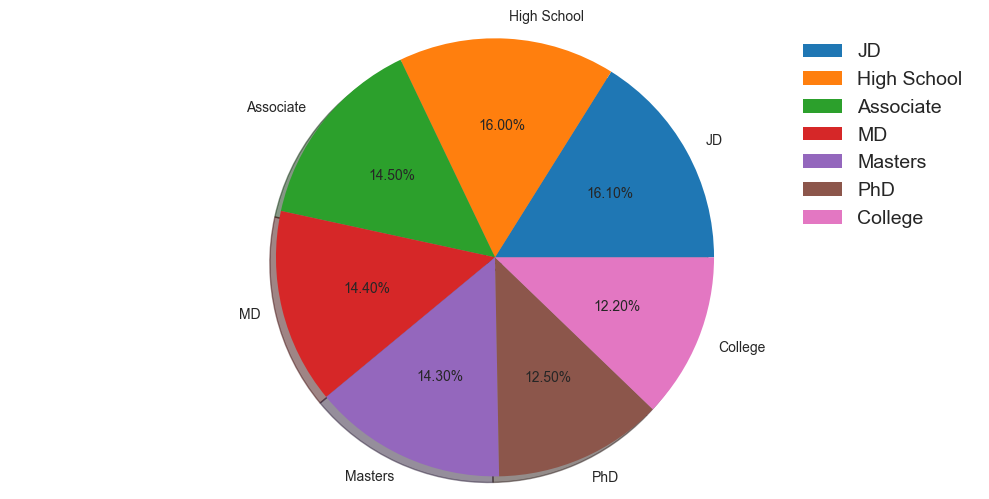

Single digit category column name: incident_state


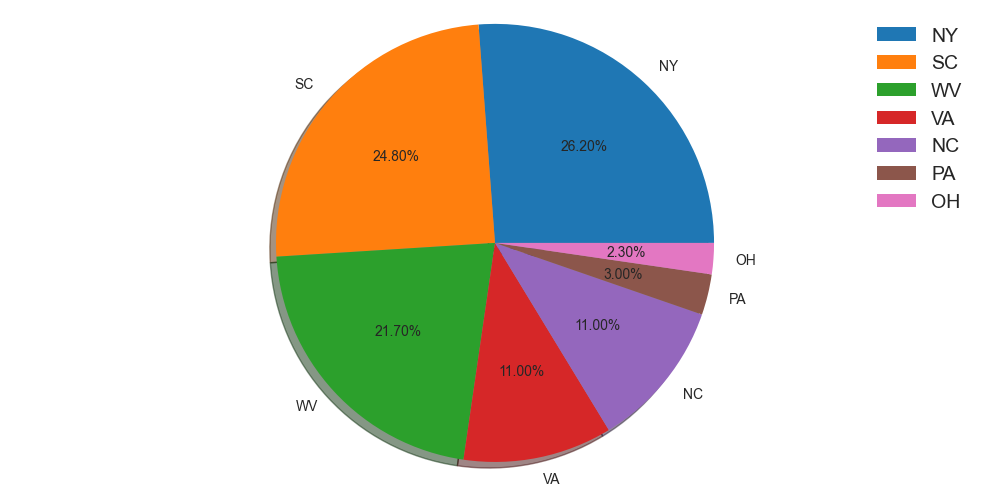

Single digit category column name: incident_city


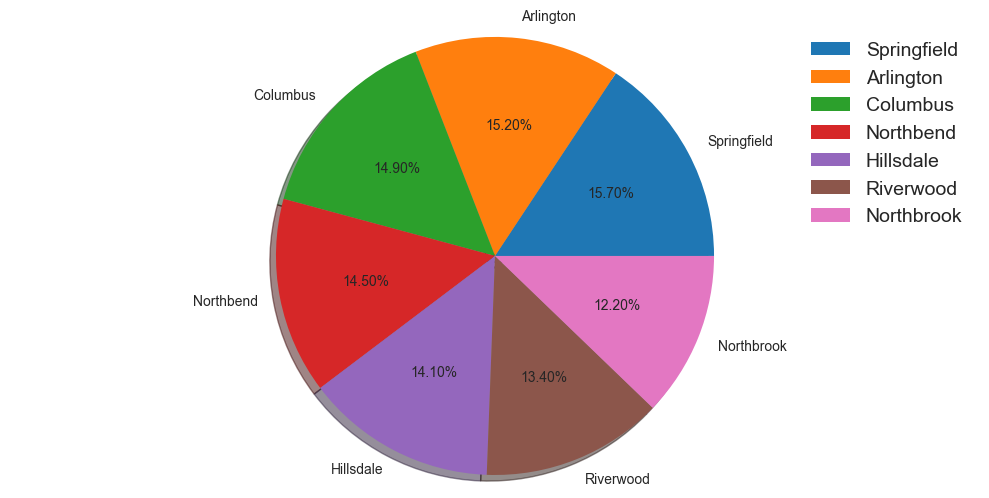

In [26]:
def pie_chart(x):
    plt.style.use('seaborn-white')
    plt.figure(figsize=(10,5))
    plt.pie(x.value_counts(), labels=x.value_counts().index, shadow=True, autopct='%1.2f%%')
    plt.legend(prop={'size':14})
    plt.axis('equal')
    plt.tight_layout()
    return plt.show()

col1 = ['fraud_reported', 'insured_sex', 'policy_state', 'policy_csl', 'policy_deductable', 'bodily_injuries',
        'police_report_available', 'property_damage', 'incident_type', 'collision_type', 'incident_severity',
        'number_of_vehicles_involved', 'witnesses', 'authorities_contacted', 'insured_relationship',
        'insured_education_level', 'incident_state', 'incident_city']

for i in df[col1]:
    print(f"Single digit category column name:", i)
    pie_chart(df[i])

**Observation**

* we can see approx 24% of data has fraud activity which we need  tp balance
* Female has more contribution in policy as we can see female percentages are upto 53%
* Maximum policy are from OH state
* policy deductable is high in 1000 range
* 65 % pepole are saying that they are bodily_injured
* Many of them approx 34% cliams dont have police report available
* we have 30% property damage and 33% no damage 
* In incidant type we can see Parked car vehicle incidant ahe very less, they are only 8 % howeever multivehicle collision is high in range upto 41%
* Rear collosion is high in percentage as we can see it is upto 29%
* 58% data says that there were single vehicle involved
* Witness are equally distributed
* We can see that most of incident or highest incident rate is in NY state followed by SC
* Springfield city has highest rate of incident as we can see upto 15 % incident from this city



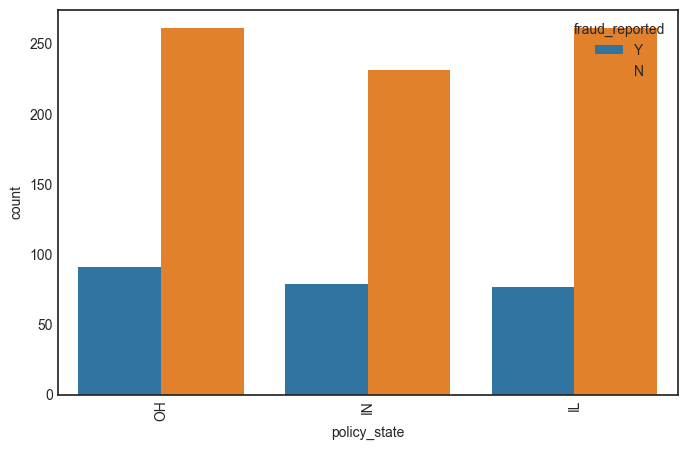

In [27]:
plt.figure(figsize=(8,5))
sns.countplot(data=df,x='policy_state',hue='fraud_reported')
plt.xticks(rotation=90)
plt.show()

We can see fraud cases are high in OH state and for other two state they are almost same

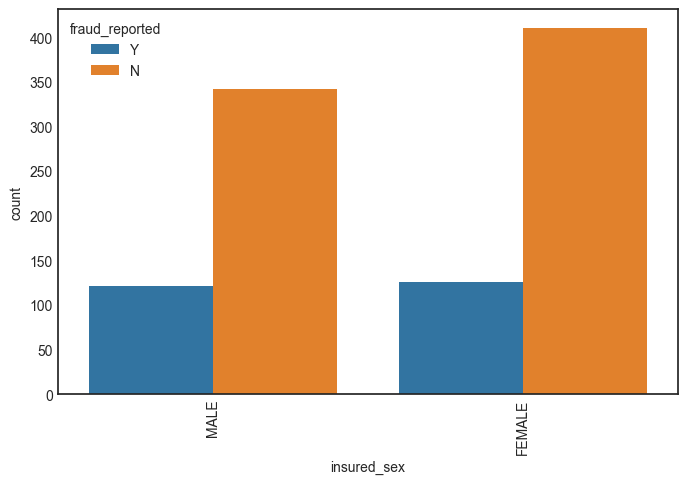

In [28]:
plt.figure(figsize=(8,5))
sns.countplot(data=df,x='insured_sex',hue='fraud_reported')
plt.xticks(rotation=90)
plt.show()

Female have done more fraudelent activity as we can see in above plot

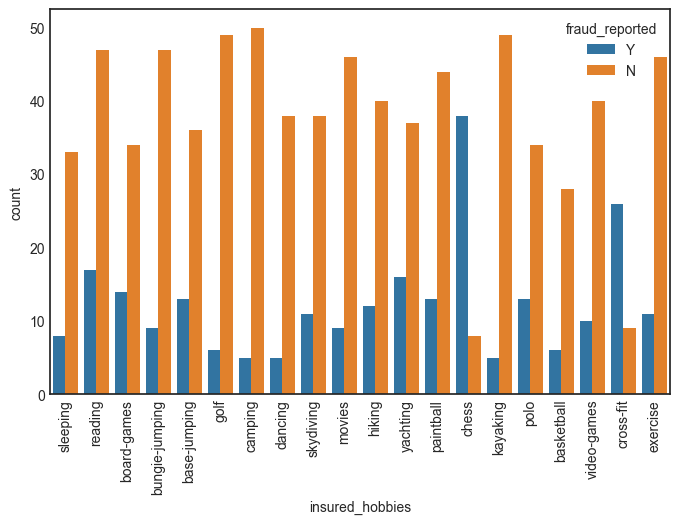

In [29]:
plt.figure(figsize=(8,5))
sns.countplot(data=df,x='insured_hobbies',hue='fraud_reported')
plt.xticks(rotation=90)
plt.show()

We can see fraud in high in Chess catagory

# Bivariate Analysis

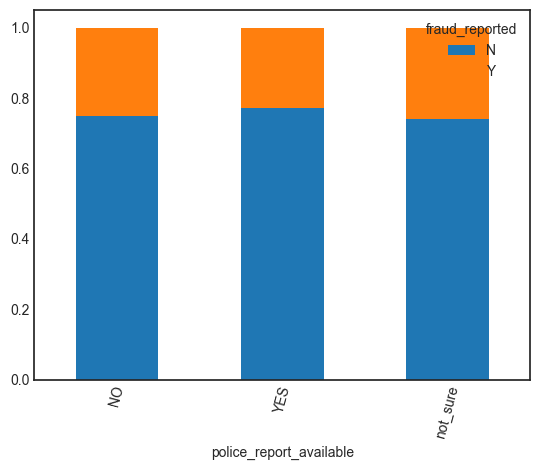

In [30]:
ba = pd.crosstab(df.police_report_available, df.fraud_reported,normalize='index')
ba.plot.bar(stacked=True)
plt.xticks(rotation=75)
plt.show()

Those who dont have polivy report they might be potentila frauds as we can see count is hight in above graph

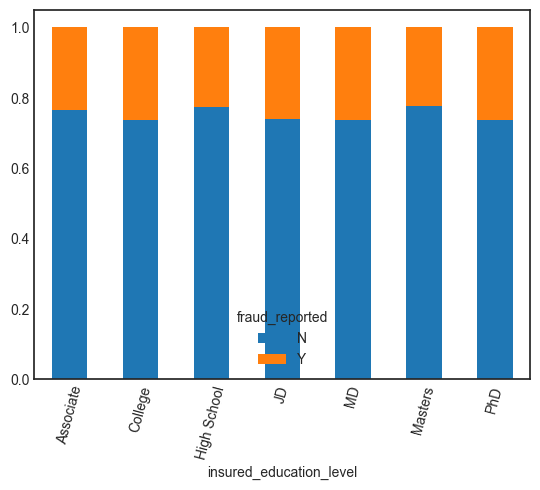

In [31]:
ba = pd.crosstab(df.insured_education_level, df.fraud_reported,normalize='index')
ba.plot.bar(stacked=True)
plt.xticks(rotation=75)
plt.show()

College students and Phd educated are highest contribution in Fraud

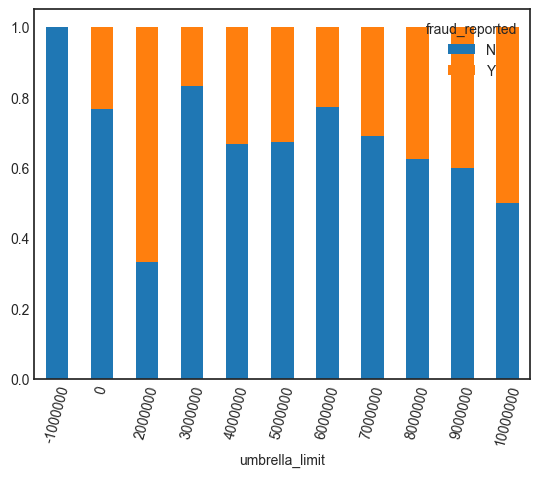

In [32]:
ba = pd.crosstab(df.umbrella_limit , df.fraud_reported,normalize='index')
ba.plot.bar(stacked=True)
plt.xticks(rotation=75)
plt.show()

Those who are having high umbrella_limit they are high in fraud count

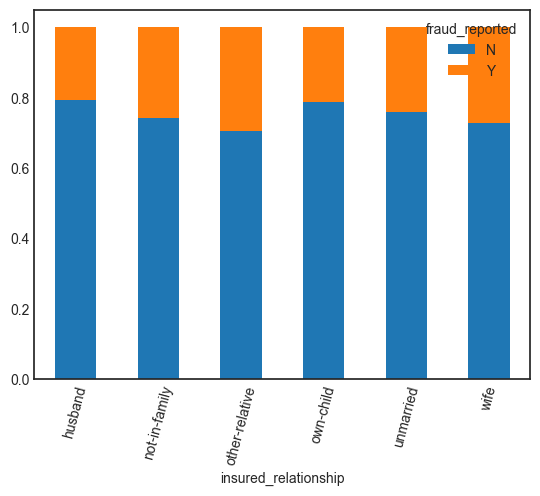

In [33]:
ct = pd.crosstab(df.insured_relationship, df.fraud_reported,normalize='index')
ct.plot.bar(stacked=True)
plt.xticks(rotation=75)
plt.show()

Other relative has high chance of fraud

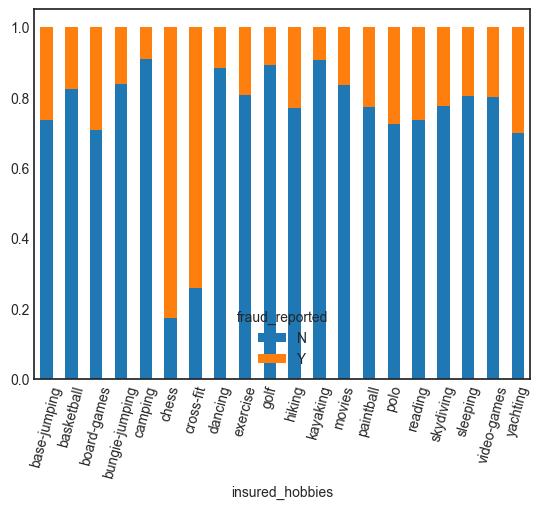

In [34]:
tf = pd.crosstab(df.insured_hobbies, df.fraud_reported,normalize='index')
tf.plot.bar(stacked=True)
plt.xticks(rotation=75)
plt.show()

Chess and cross fit has high chnace of fraud

Plotting histogram to see distribution

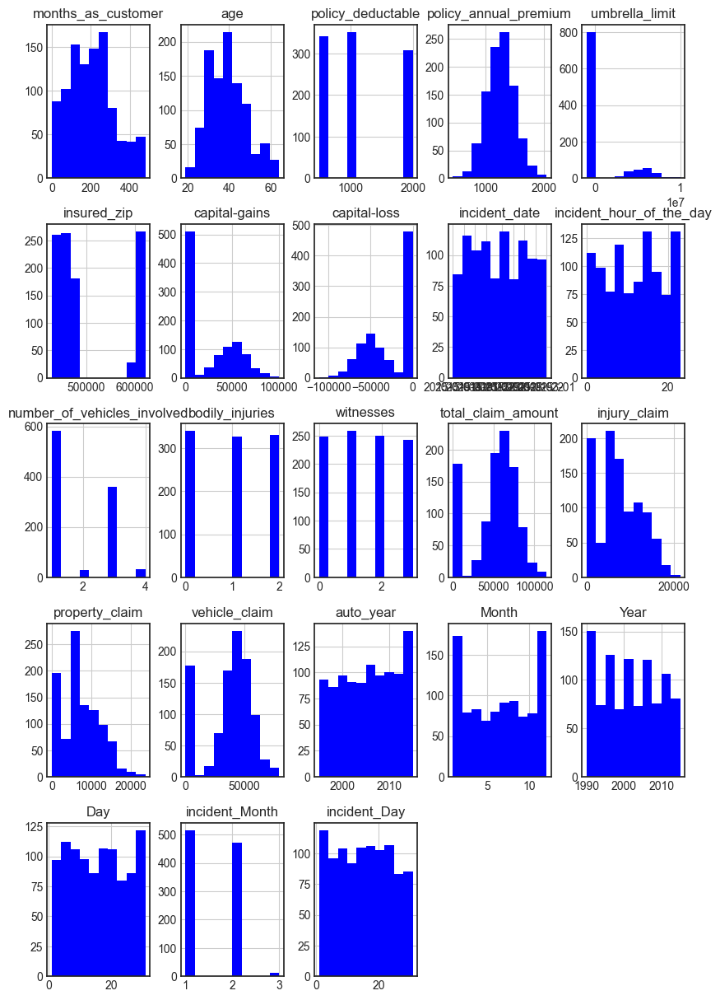

In [35]:
df.hist(figsize=(10,15),color = 'blue');

We can see that most of the data is normally distributed however some them are not like capital gain and month as customer

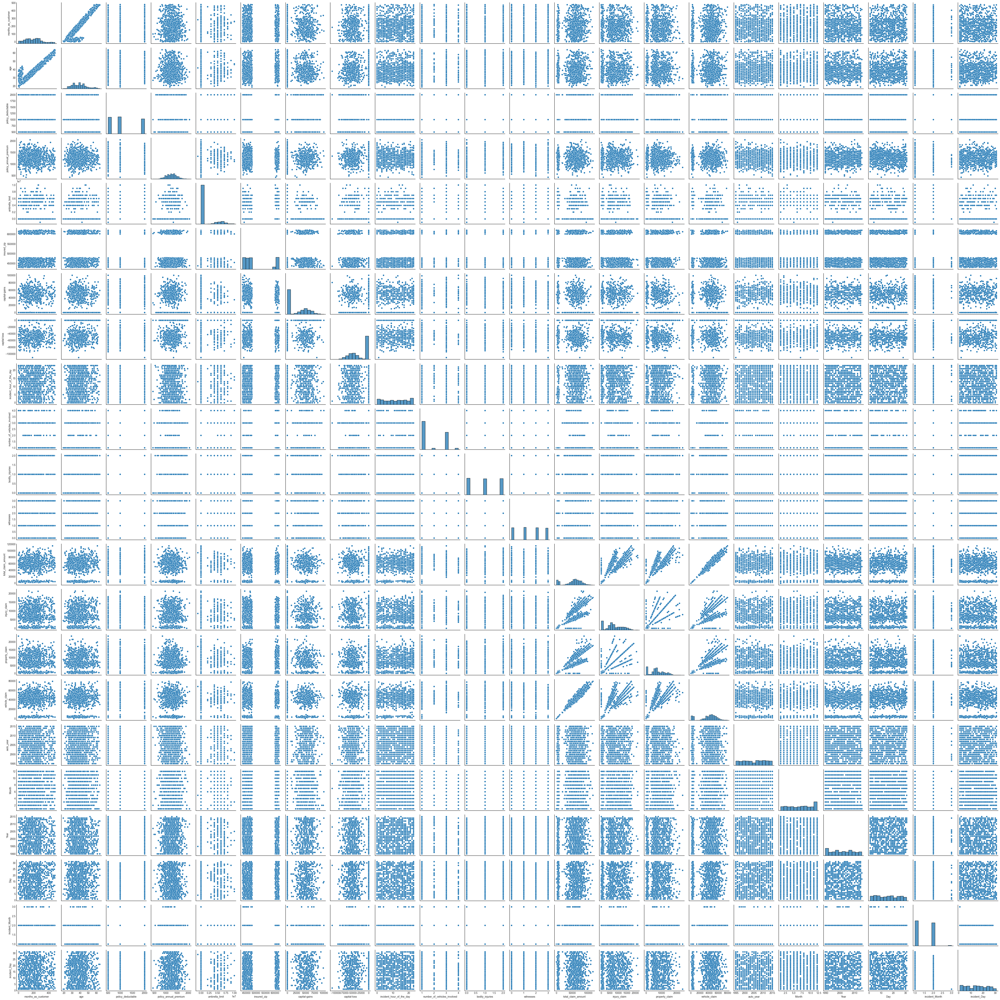

In [36]:
sns.pairplot(df)

I dont see any linear relation except age and month as customer. we can review relation of every column with each other to have better understanding of data

# Descriptive statistics

In [37]:
df.describe().T

,count,mean,min,25%,50%,75%,max,std
months_as_customer,1000.0,203.954,0.0,115.75,199.5,276.25,479.0,115.113174
age,1000.0,38.948,19.0,32.0,38.0,44.0,64.0,9.140287
policy_deductable,1000.0,1136.0,500.0,500.0,1000.0,2000.0,2000.0,611.864673
policy_annual_premium,1000.0,1256.40615,433.33,1089.6075,1257.2,1415.695,2047.59,244.167395
umbrella_limit,1000.0,1101000.0,-1000000.0,0.0,0.0,0.0,10000000.0,2297406.598118
insured_zip,1000.0,501214.488,430104.0,448404.5,466445.5,603251.0,620962.0,71701.610941
capital-gains,1000.0,25126.1,0.0,0.0,0.0,51025.0,100500.0,27872.187708
capital-loss,1000.0,-26793.7,-111100.0,-51500.0,-23250.0,0.0,0.0,28104.096686
incident_date,1000,2015-01-30 08:02:24,2015-01-01 00:00:00,2015-01-15 00:00:00,2015-01-31 00:00:00,2015-02-15 00:00:00,2015-03-01 00:00:00,NaN
incident_hour_of_the_day,1000.0,11.644,0.0,6.0,12.0,17.0,23.0,6.951373


**Observation**

Below are some column where we can see outliers due to maz value is hight as compare to 25% to 75% range

* Total_claim_amount
* injury cliam
* umbrella_limit	
* months_as_customer

*****************************************

* Capital loss all values are in negative in below 50% qurtile range
* Capital gain is above 50% percentile range

# Encoding object using labelEncoder

In [38]:
objects = []
for i in df.dtypes.index:
    if df.dtypes[i] == 'O':
        objects.append(i)

In [39]:
# Handling Objest using LabelEncoder
from sklearn.preprocessing import LabelEncoder
le=LabelEncoder()

for i in objects:
    df[i]=le.fit_transform(df[i].astype(str))

In [40]:
df.dtypes

months_as_customer                      int64
age                                     int64
policy_state                            int32
policy_csl                              int32
policy_deductable                       int64
policy_annual_premium                 float64
umbrella_limit                          int64
insured_zip                             int64
insured_sex                             int32
insured_education_level                 int32
insured_occupation                      int32
insured_hobbies                         int32
insured_relationship                    int32
capital-gains                           int64
capital-loss                            int64
incident_date                  datetime64[ns]
incident_type                           int32
collision_type                          int32
incident_severity                       int32
authorities_contacted                   int32
incident_state                          int32
incident_city                     

We have converted our all data in numeric format from object

In [41]:
# Checking correlation for all colouns

df.corr()

,months_as_customer,age,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,insured_sex,insured_education_level,...,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,Month,Year,Day,incident_Month,incident_Day
months_as_customer,1.000000,0.922098,-0.000328,-0.026819,0.026807,0.005018,0.015498,0.017895,0.060925,-0.000833,...,0.061013,0.047655,0.004202,-0.000292,0.020544,-0.001559,-0.048276,0.054809,-0.042826,-0.001455
age,0.922098,1.000000,-0.014533,-0.015185,0.029188,0.014404,0.018126,0.025604,0.073337,0.000969,...,0.062588,0.030410,0.017343,0.001354,0.012143,0.008357,-0.037444,0.056776,-0.037058,0.003697
policy_state,-0.000328,-0.014533,1.000000,0.001027,0.010033,0.012455,-0.029580,0.008777,-0.020481,-0.034327,...,0.001425,0.017124,-0.025253,0.002114,0.029432,0.046871,-0.007276,0.011178,0.018531,0.025572
policy_csl,-0.026819,-0.015185,0.001027,1.000000,0.003384,0.023978,0.021636,0.006879,-0.010757,0.009153,...,-0.046791,-0.004701,0.047885,-0.033082,-0.037190,-0.021547,-0.016466,0.010164,-0.030164,-0.007640
policy_deductable,0.026807,0.029188,0.010033,0.003384,1.000000,-0.003245,0.010870,0.004545,-0.009733,0.015217,...,0.005269,-0.035379,-0.003268,0.026105,0.014817,-0.025020,-0.049598,-0.000265,-0.026416,-0.022701
policy_annual_premium,0.005018,0.014404,0.012455,0.023978,-0.003245,1.000000,-0.006247,0.032354,0.038853,-0.019715,...,0.020246,0.000045,-0.031849,-0.049226,-0.014480,-0.002480,0.001249,-0.037933,-0.046097,0.028797
umbrella_limit,0.015498,0.018126,-0.029580,0.021636,0.010870,-0.006247,1.000000,0.019671,0.010688,-0.019357,...,-0.038584,-0.004443,0.040256,0.009893,0.058622,-0.045871,0.048008,-0.023361,-0.002576,-0.009974
insured_zip,0.017895,0.025604,0.008777,0.006879,0.004545,0.032354,0.019671,1.000000,-0.036942,0.016079,...,-0.041083,-0.020892,0.023637,-0.032736,0.019368,0.025924,-0.001100,-0.044250,-0.032630,0.027031
insured_sex,0.060925,0.073337,-0.020481,-0.010757,-0.009733,0.038853,0.010688,-0.036942,1.000000,0.009002,...,-0.029609,0.026457,-0.018421,-0.028247,0.030873,-0.001042,-0.032891,0.039769,-0.025471,0.001924
insured_education_level,-0.000833,0.000969,-0.034327,0.009153,0.015217,-0.019715,-0.019357,0.016079,0.009002,1.000000,...,0.068348,0.055202,0.049445,0.043509,0.008808,-0.082494,0.018952,0.042708,-0.053106,-0.038402


<Axes: >

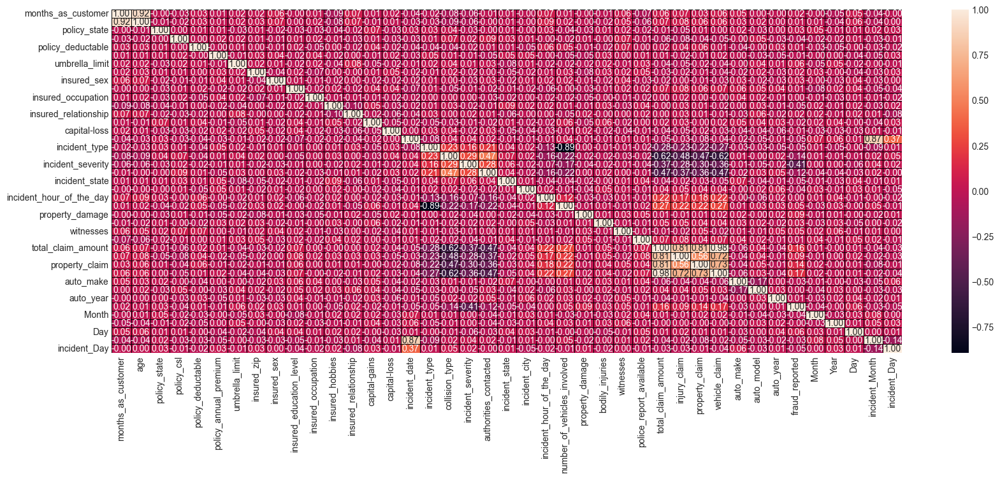

In [42]:
#As we see above all are correlation with each other and it is bit hard to understand hence we will plot these correlation on heatmap.

import matplotlib.pyplot as plt
plt.figure(figsize=(20,7))
sns.heatmap(df.corr(),annot=True,linewidths=0.6,linecolor="black",fmt='.2f')

In [43]:
#As we have huge range of column we will try to see correlation of all column with our target variable

df.corr()['fraud_reported'].sort_values(ascending=False)

fraud_reported                 1.000000
vehicle_claim                  0.170049
total_claim_amount             0.163651
property_claim                 0.137835
injury_claim                   0.090975
property_damage                0.087639
Day                            0.063040
umbrella_limit                 0.058622
number_of_vehicles_involved    0.051839
witnesses                      0.049497
bodily_injuries                0.033877
insured_sex                    0.030873
policy_state                   0.029432
insured_relationship           0.021043
months_as_customer             0.020544
insured_zip                    0.019368
policy_deductable              0.014817
age                            0.012143
insured_education_level        0.008808
police_report_available        0.008399
auto_year                      0.007928
incident_hour_of_the_day       0.004316
insured_occupation             0.001564
auto_model                     0.000720
Year                          -0.000059


# Plotting correlation on Bar plot

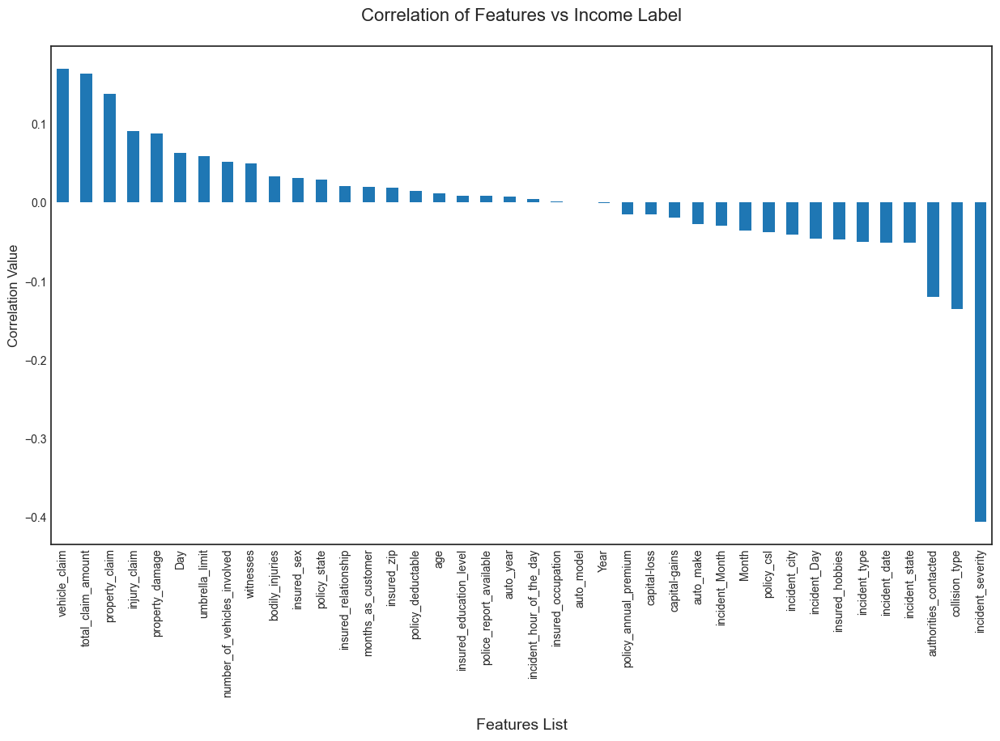

In [44]:
plt.style.use('seaborn-white')

df_corr = df.corr()
plt.figure(figsize=(15,8))
df_corr['fraud_reported'].sort_values(ascending=False).drop('fraud_reported').plot.bar()
plt.title("Correlation of Features vs Income Label\n", fontsize=16)
plt.xlabel("\nFeatures List", fontsize=14)
plt.ylabel("Correlation Value", fontsize=12)
plt.show()

* We can see that half of the columns are postively correlated and more that 40% are negatively correlated we need both to traine model

#### I can see that there are some columns with almost zero correlation which I can drop from data set. They are as below

* Year
* auto_model
* insured_occupation


In [45]:
# Dropping no correalted columns

df.drop('Year',axis=1,inplace=True)
df.drop('auto_model',axis=1,inplace=True)
df.drop('insured_occupation',axis=1,inplace=True)

Done we have dropped uneccesary columns now

# Outliers Checking in Dataset

In [46]:
# We need to drop "incident_date" is date format is not allowed and we have already added extra columns for that

df.drop('incident_date',axis=1,inplace=True)

<function matplotlib.pyplot.show(close=None, block=None)>

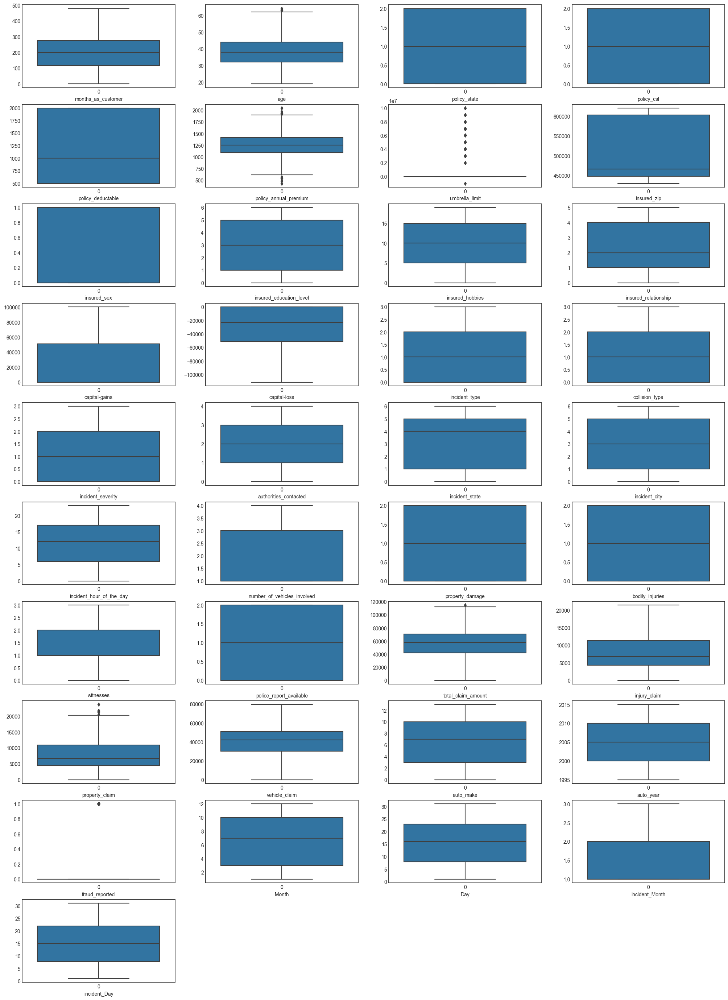

In [47]:
plt.figure(figsize=(25,35))

graph=1

for i in df:
    if graph<=38:
        plt.subplot(10,4,graph)
        sns.boxplot(data=df[i])
        plt.xlabel(i)
    graph+=1    
    
plt.show

## Outliers detected in below columns

* age
* total claim amount
* incident_Month
* Property cliam

In [48]:
# Lets Treat outliers

from scipy.stats import zscore
zscore=zscore(df)
zabs=np.abs(zscore)

z=df[(zabs<3).all(axis=1)]

In [49]:
z.shape

(980, 37)

In [50]:
df.shape

(1000, 37)

In [51]:
loss=(1000-980)/1000*100
loss

2.0

#### 2% data loss is acceptable to remove outliers

In [52]:
dropindex=df.index.difference(z.index)
dropindex

Index([ 31,  48,  88, 115, 119, 229, 248, 262, 314, 430, 458, 500, 503, 657,
       700, 763, 807, 875, 922, 975],
      dtype='int64')

In [53]:
df.drop(dropindex,inplace=True)
df

,months_as_customer,age,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,insured_sex,insured_education_level,...,injury_claim,property_claim,vehicle_claim,auto_make,auto_year,fraud_reported,Month,Day,incident_Month,incident_Day
0,328,48,2,1,1000,1406.91,0,466132,1,4,...,6510,13020,52080,10,2004,1,10,17,1,25
1,228,42,1,1,2000,1197.22,5000000,468176,1,4,...,780,780,3510,8,2007,1,6,27,1,21
2,134,29,2,0,2000,1413.14,5000000,430632,0,6,...,7700,3850,23100,4,2007,0,9,6,2,22
3,256,41,0,1,2000,1415.74,6000000,608117,0,6,...,6340,6340,50720,3,2014,1,5,25,1,10
4,228,44,0,2,1000,1583.91,6000000,610706,1,0,...,1300,650,4550,0,2009,0,6,6,2,17
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,3,38,2,2,1000,1310.80,0,431289,0,5,...,17440,8720,61040,6,2006,0,7,16,2,22
996,285,41,0,0,1000,1436.79,0,608177,0,6,...,18080,18080,72320,13,2015,0,1,5,1,24
997,130,34,2,1,500,1383.49,3000000,442797,0,5,...,7500,7500,52500,11,1996,0,2,17,1,23
998,458,62,0,2,2000,1356.92,5000000,441714,1,0,...,5220,5220,36540,1,1998,0,11,18,2,26


<function matplotlib.pyplot.show(close=None, block=None)>

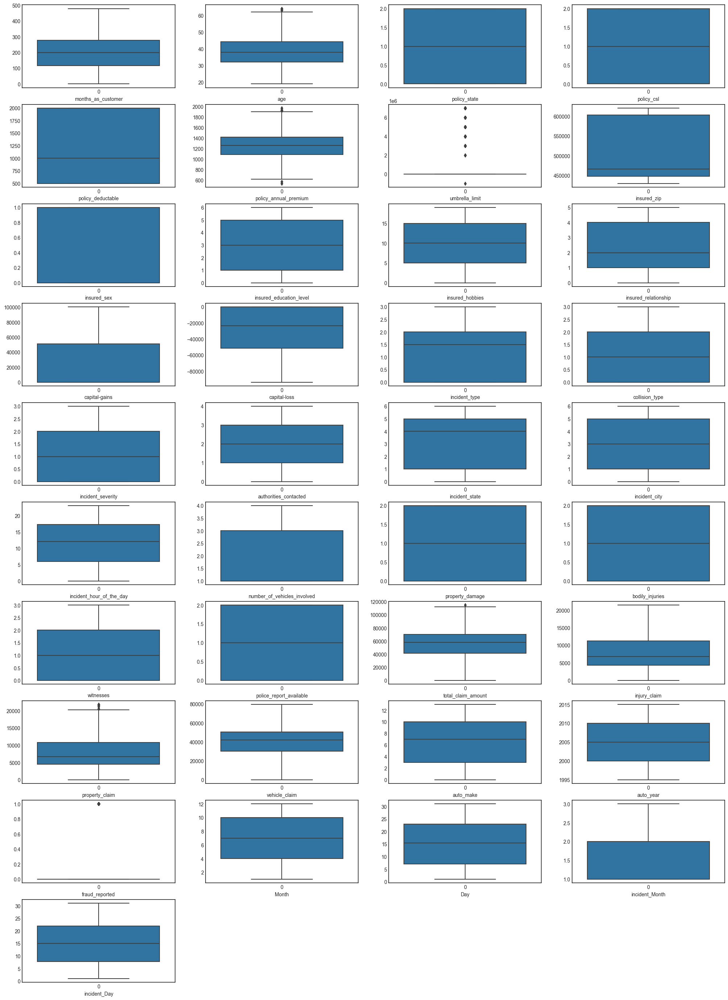

In [54]:
# Cheking after outliers removed

plt.figure(figsize=(25,35))

graph=1

for i in df:
    if graph<=38:
        plt.subplot(10,4,graph)
        sns.boxplot(data=df[i])
        plt.xlabel(i)
    graph+=1    
    
plt.show

Ok we handled up to possible level now we can go ahead

## We should check skewness of data before processing

In [55]:
df[number_datatype].skew()

months_as_customer             0.362608
age                            0.475385
policy_deductable              0.476090
policy_annual_premium          0.035964
umbrella_limit                 1.801424
insured_zip                    0.837283
capital-gains                  0.466619
capital-loss                  -0.376884
incident_hour_of_the_day      -0.039280
number_of_vehicles_involved    0.509725
bodily_injuries                0.003757
witnesses                      0.026211
total_claim_amount            -0.593593
injury_claim                   0.271759
property_claim                 0.361356
vehicle_claim                 -0.620936
auto_year                     -0.054522
dtype: float64

<function matplotlib.pyplot.show(close=None, block=None)>

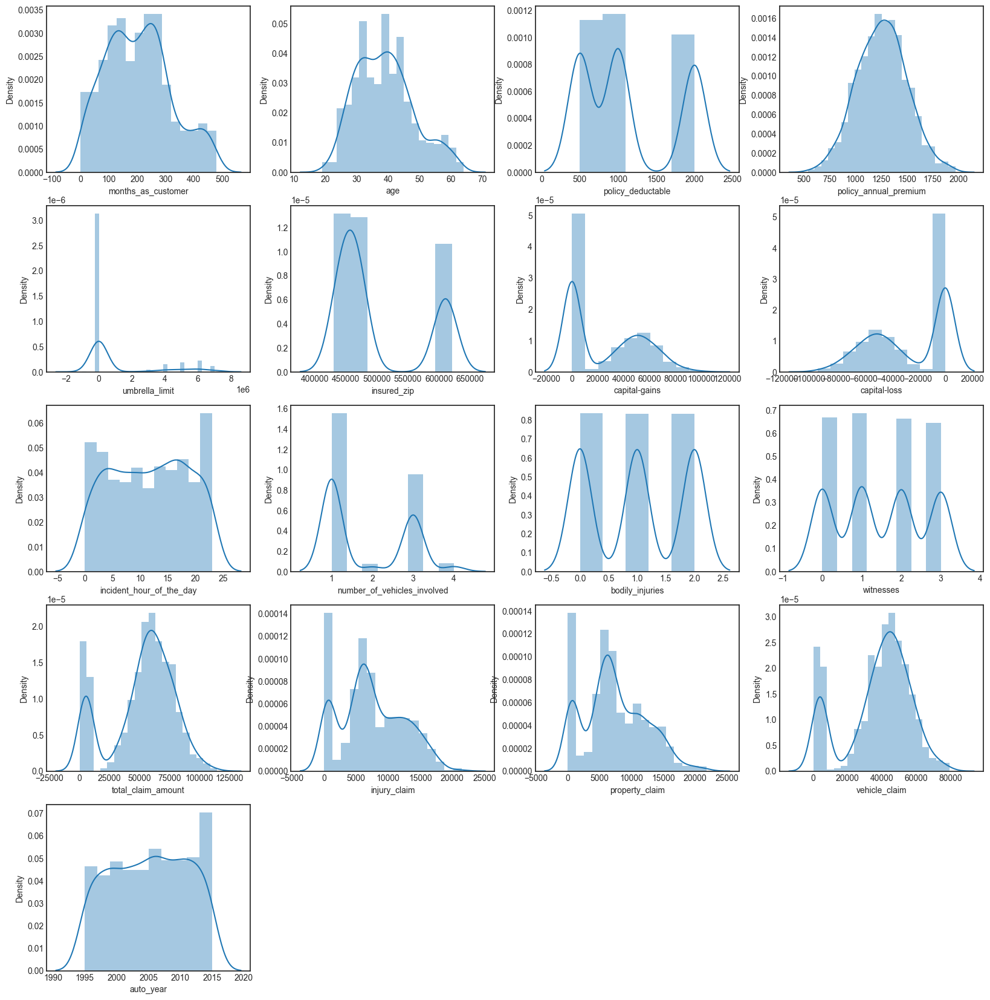

In [56]:
plt.figure(figsize=(20,25),facecolor="white")

plot=1

for i in number_datatype:
    if plot<=22:
        plt.subplot(6,4,plot)
        sns.distplot(df[i])
        plt.xlabel(i)
    plot+=1    
    
plt.show

### Below are skewed columns as I can observe

* months_as_customer
* age
* policy_deductable
* umbrella_limit
* insured_zip
* capital-gains
* capital-loss
* number_of_vehicles_involved
* total_claim_amount
* vehicle_claim
* incident_Month

# Removing Skewness using yeo-johnson method

In [57]:
skewed_features = ['months_as_customer','age','policy_deductable','umbrella_limit','insured_zip','capital-gains','capital-loss','number_of_vehicles_involved','total_claim_amount','vehicle_claim','incident_Month']

from sklearn.preprocessing import PowerTransformer
scale = PowerTransformer(method='yeo-johnson')

In [58]:
df[skewed_features] = scale.fit_transform(df[skewed_features].values)
df[skewed_features].head()

,months_as_customer,age,policy_deductable,umbrella_limit,insured_zip,capital-gains,capital-loss,number_of_vehicles_involved,total_claim_amount,vehicle_claim,incident_Month
0,1.044541,1.002330,0.063154,-0.337086,-5.551115e-16,1.028989,1.048516,-0.839387,0.720163,0.758130,-0.967404
1,0.299045,0.427171,1.271808,1.482455,-4.996004e-16,-0.986627,1.048516,-0.839387,-1.778146,-1.787485,-0.967404
2,-0.515819,-1.136013,1.271808,1.482455,-1.720846e-15,0.955106,1.048516,1.194880,-0.715924,-0.820246,0.993761
3,0.517526,0.324015,1.271808,1.788485,2.164935e-15,1.013773,-1.006291,-0.839387,0.395030,0.681832,-0.967404
4,0.299045,0.626869,0.063154,1.788485,2.164935e-15,1.066686,-0.941672,-0.839387,-1.730904,-1.740862,0.993761


<function matplotlib.pyplot.show(close=None, block=None)>

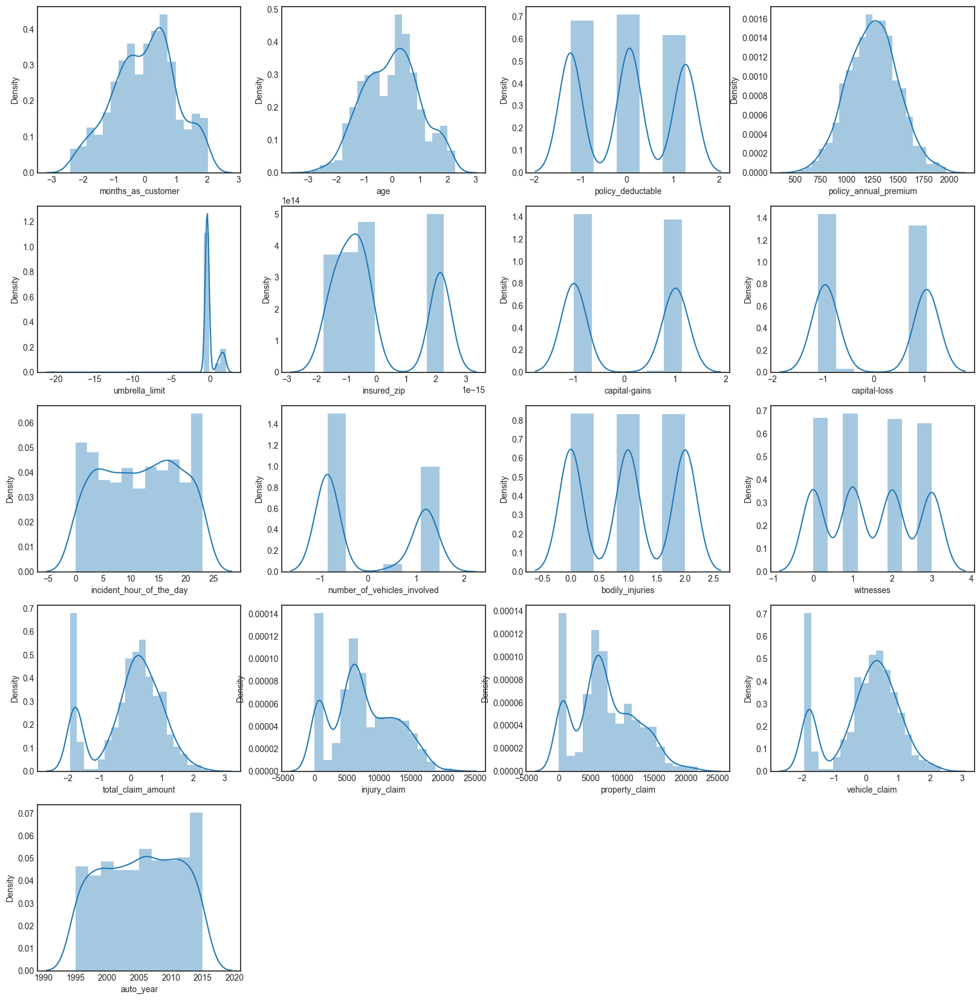

In [59]:
plt.figure(figsize=(20,25),facecolor="white")

plot=1

for i in number_datatype:
    if plot<=22:
        plt.subplot(6,4,plot)
        sns.distplot(df[i])
        plt.xlabel(i)
    plot+=1    
    
plt.show

## Outliers and skewness are removed now and we are ready to define X and Y

In [60]:
x = df.drop('fraud_reported', axis=1)
y = df['fraud_reported']
x.shape

(980, 36)

In [61]:
y.shape

(980,)

We have see in visualization part about class imbalanec which we need to treat before processing

In [62]:
y.value_counts()

fraud_reported
0    740
1    240
Name: count, dtype: int64

# SMOT for oversampling

In [63]:
# adding samples to make all the categorical label values same
from imblearn.over_sampling import SMOTE # importing SMOT
oversample = SMOTE()
x, y = oversample.fit_resample(x, y)

In [64]:
y.value_counts()

fraud_reported
1    740
0    740
Name: count, dtype: int64

Our classes are baalancesd now that means we have added dummy information.

# Feature Scaling

In [65]:
from sklearn.preprocessing import StandardScaler # Using standard scaller

scaler = StandardScaler()
x = pd.DataFrame(scaler.fit_transform(x), columns=x.columns)
x.head()

,months_as_customer,age,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,insured_sex,insured_education_level,...,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_year,Month,Day,incident_Month,incident_Day
0,1.089498,1.047922,1.342831,0.236525,0.072014,0.662047,-0.414221,-0.452363,1.247450,0.648678,...,0.666071,-0.230739,1.093295,0.702330,0.973411,-0.180100,1.129588,0.128925,-1.011699,1.296372
1,0.311765,0.453426,0.079392,0.236525,1.334892,-0.270490,1.601504,-0.411092,1.247450,0.648678,...,-1.980573,-1.440615,-1.476588,-1.998616,0.447050,0.347717,-0.087809,1.319254,-1.011699,0.804951
2,-0.538336,-1.162311,1.342831,-1.069657,1.334892,0.689753,1.601504,-1.319057,-0.801635,1.739017,...,-0.855283,0.020527,-0.832018,-0.972357,-0.605670,0.347717,0.825239,-1.180436,1.069859,0.927806
3,0.539693,0.346801,-1.184048,0.236525,1.334892,0.701316,1.940531,1.569922,-0.801635,1.739017,...,0.321634,-0.266634,-0.309223,0.621376,-0.868850,1.579288,-0.392158,1.081188,-1.011699,-0.546457
4,0.311765,0.659838,-1.184048,1.542706,0.072014,1.449205,1.940531,1.569922,1.247450,-1.532000,...,-1.930525,-1.330818,-1.503882,-1.949148,-1.658390,0.699594,-0.087809,-1.180436,1.069859,0.313530


We did above feature Scalling to avoid distance bias between values and calculation of them

# Finding best random stage

In [66]:
import sklearn
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.linear_model import SGDClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import GradientBoostingClassifier, BaggingClassifier

#metrics
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.metrics import accuracy_score
from sklearn.metrics import r2_score,mean_squared_error
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score

In [67]:
maxAcc = 0
maxRS = 0

for i in range(1,300):
    x_train,x_test,y_train,y_test = train_test_split(x,y,test_size=.20, random_state=i)
    modRF = RandomForestRegressor()
    modRF.fit(x_train,y_train)
    pred = modRF.predict(x_test)
    acc = r2_score(y_test,pred)
    if acc>maxAcc:
        maxAcc = acc
        maxRs=i
print(f"Best Accuracy is: {maxAcc} on Random State: {maxRs}")

Best Accuracy is: 0.744716729846997 on Random State: 23


We have our best random state is 23 which is giving us 74 accuracy

# Feature importance

In [68]:
rf=RandomForestClassifier()
rf.fit(x_train, y_train)
importances = pd.DataFrame({'Features':x.columns, 'Importance':np.round(rf.feature_importances_,3)})
importances = importances.sort_values('Importance', ascending=False).set_index('Features')
importances

,Importance
Features,
incident_severity,0.220
insured_hobbies,0.043
insured_zip,0.042
capital-loss,0.040
vehicle_claim,0.036
capital-gains,0.032
property_claim,0.031
incident_state,0.030
total_claim_amount,0.030


## Tarining all classification models now

I have defined one function which I will use now to implement all possible classification model and compare matrix for them. Finaly we will select and save one best model

In [69]:
x_train,x_test,y_train,y_test = train_test_split(x,y,test_size=.20, random_state=222)

In [72]:
LOGR = LogisticRegression(solver = 'liblinear')
RFC = RandomForestClassifier()
DTC = DecisionTreeClassifier()
SV = SVC()
EXT=ExtraTreesClassifier()
Gbc=GradientBoostingClassifier()
BG=BaggingClassifier()

model=[LOGR,RFC,DTC,SV,EXT,Gbc,BG]


for i in model:
    i.fit(x_train,y_train)
    predi=i.predict(x_test)
    print('performance matrix of',i,'is:')
    print("Confusion matrix :",confusion_matrix(y_test,predi))
    print("Classification report :", classification_report(y_test,predi,))
    print("Accuracy score :", accuracy_score(y_test,predi))
    print("*****************************************************************")

performance matrix of LogisticRegression(solver='liblinear') is:
Confusion matrix : [[119  21]
 [ 32 124]]
Classification report :               precision    recall  f1-score   support

           0       0.79      0.85      0.82       140
           1       0.86      0.79      0.82       156

    accuracy                           0.82       296
   macro avg       0.82      0.82      0.82       296
weighted avg       0.82      0.82      0.82       296

Accuracy score : 0.8209459459459459
*****************************************************************
performance matrix of RandomForestClassifier() is:
Confusion matrix : [[132   8]
 [ 21 135]]
Classification report :               precision    recall  f1-score   support

           0       0.86      0.94      0.90       140
           1       0.94      0.87      0.90       156

    accuracy                           0.90       296
   macro avg       0.90      0.90      0.90       296
weighted avg       0.91      0.90      0.90       2

In [73]:
from sklearn.model_selection import cross_val_score
j=[LOGR,RFC,DTC,SV,EXT,Gbc,BG]
for n in j:
  print('Cross_Validation_score of',n,'is')
  score=cross_val_score(n,x,y,cv=5)
  print(score)
  print(score.mean())
  print(score.std())
  print('\n')

Cross_Validation_score of LogisticRegression(solver='liblinear') is
[0.6722973  0.77364865 0.82432432 0.81756757 0.85135135]
0.7878378378378378
0.06292858892905434


Cross_Validation_score of RandomForestClassifier() is
[0.70945946 0.82094595 0.92905405 0.92905405 0.92567568]
0.8628378378378377
0.0871752556685471


Cross_Validation_score of DecisionTreeClassifier() is
[0.74662162 0.77027027 0.875      0.86148649 0.87837838]
0.8263513513513514
0.056231481815035636


Cross_Validation_score of SVC() is
[0.66891892 0.79054054 0.90540541 0.91891892 0.91554054]
0.8398648648648649
0.0979053820901619


Cross_Validation_score of ExtraTreesClassifier() is
[0.71283784 0.81756757 0.93581081 0.93918919 0.93581081]
0.8682432432432432
0.09042449198592757


Cross_Validation_score of GradientBoostingClassifier() is
[0.74662162 0.83783784 0.90540541 0.93243243 0.91554054]
0.8675675675675676
0.06848698777520844


Cross_Validation_score of BaggingClassifier() is
[0.79054054 0.83108108 0.89864865 0.8817567

In [74]:
#Checking difference between accuracy score and cross validation score

Models=["LOGR","RFC","DTC","SV","EXT","Gbc","BG"]
Accuracy=[82,88,85,86,89,91,90]
Cross_va=[78,86,81,83,87,86,86]

In [75]:
# Finding difference

score_diff=[]
for i in range(len(Accuracy)):
    score_diff.append(Accuracy[i]-Cross_va[i])

In [76]:
models=pd.DataFrame({})
models["Models"]=Models#
models["Accuracy"]=Accuracy
models["Cross_va"]=Cross_va
models["Differance"]=score_diff
models

,Models,Accuracy,Cross_va,Differance
0,LOGR,82,78,4
1,RFC,88,86,2
2,DTC,85,81,4
3,SV,86,83,3
4,EXT,89,87,2
5,Gbc,91,86,5
6,BG,90,86,4


We can see that ExtraTreesClassifier is working well because diffrence between accuracy score and cross validation in 2 which is Minimum difference among all models we have train

## Hyper Parameter Tuning for ExtraTreesClassifier

In [77]:
from sklearn.model_selection import GridSearchCV

EXT.get_params()

{'bootstrap': False,
 'ccp_alpha': 0.0,
 'class_weight': None,
 'criterion': 'gini',
 'max_depth': None,
 'max_features': 'sqrt',
 'max_leaf_nodes': None,
 'max_samples': None,
 'min_impurity_decrease': 0.0,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'n_estimators': 100,
 'n_jobs': None,
 'oob_score': False,
 'random_state': None,
 'verbose': 0,
 'warm_start': False}

In [78]:
parameters= {'n_estimators':[10,50,100],
             'criterion':['gini', 'entropy'],
             'max_depth':[1, 2,34,None],
            'min_samples_split':[2, 8, 34],
            'min_samples_leaf':[1, 2,34],
            'max_features': ['auto', 'sqrt', 'log2',],
            'max_leaf_nodes':[2, 5, 8,55]}

In [79]:
GVC=GridSearchCV(ExtraTreesClassifier(),parameters,cv=3)

In [80]:
GVC.fit(x_train,y_train)

GridSearchCV(cv=3, estimator=ExtraTreesClassifier(),
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': [1, 2, 34, None],
                         'max_features': ['auto', 'sqrt', 'log2'],
                         'max_leaf_nodes': [2, 5, 8, 55],
                         'min_samples_leaf': [1, 2, 34],
                         'min_samples_split': [2, 8, 34],
                         'n_estimators': [10, 50, 100]})

In [87]:
GVC.best_params_

{'criterion': 'gini',
 'max_depth': None,
 'max_features': 'sqrt',
 'max_leaf_nodes': 55,
 'min_samples_leaf': 2,
 'min_samples_split': 8,
 'n_estimators': 100}

In [88]:
Final_Model = ExtraTreesClassifier(criterion='gini',
 max_depth=None,
 max_features='sqrt',
 max_leaf_nodes=55,
 min_samples_leaf=2,
 min_samples_split=8,
 n_estimators=100)


In [89]:
Classifier = Final_Model.fit(x_train, y_train)
fmod_pred = Final_Model.predict(x_test)
fmod_acc = (accuracy_score(y_test, fmod_pred))*100
print("Accuracy score for the Best Model is:", fmod_acc)

Accuracy score for the Best Model is: 87.16216216216216


#### When I used best paramenter suggested by gridsearchcv I got accuracy upto 84% and it was less than deafult parameters. then I Increased MAX_leaf_nodes up to 300 and got good accuracy of 87 %

## Confusion Matrix

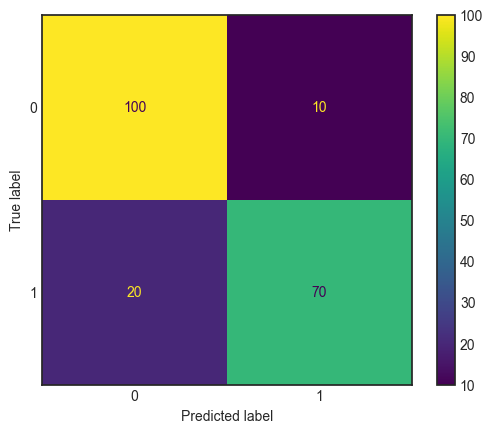

In [90]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import ConfusionMatrixDisplay

# Create a confusion matrix
confusion_matrix = np.array([[100, 10], [20, 70]])

# Create a ConfusionMatrixDisplay object
cm_display = ConfusionMatrixDisplay(confusion_matrix)

# Plot the confusion matrix
cm_display.plot()
plt.show()

**Observation**

* 100 True positive
* 10  False Postitive
* 20  False negative
* 70 True Negative


# Saving Final model

In [91]:
# Saving the model using .pkl
import joblib
joblib.dump(Final_Model ,"Insur_fraud")

['Insur_fraud']

### Lets use model to predict again

In [92]:
# Loading the saved model
model=joblib.load("Insur_fraud")

#Prediction
prediction = model.predict(x_test)
prediction

array([0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0,
       0, 0, 1, 0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 1, 0, 1, 1, 0, 1, 0, 0, 0,
       0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0, 1, 0, 1, 1, 1, 1, 1,
       1, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 1, 1, 1, 0, 1, 1, 1, 0, 1,
       1, 0, 1, 0, 1, 1, 0, 1, 0, 0, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 0,
       1, 0, 0, 0, 0, 1, 0, 0, 1, 1, 1, 0, 1, 0, 1, 1, 1, 0, 0, 1, 1, 0,
       1, 0, 0, 1, 0, 1, 0, 1, 1, 1, 1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 1, 0,
       1, 0, 1, 0, 0, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1, 0, 0, 1, 1, 0, 0, 1,
       1, 1, 1, 1, 1, 0, 0, 1, 0, 1, 1, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 1,
       1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 1, 0, 0, 1, 1, 0, 1, 1,
       0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 0, 1, 1,
       0, 1, 1, 1, 1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 1, 1,
       1, 1, 1, 1, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 1, 1, 1, 0, 1, 0, 0])

In [94]:
a=np.array(y_test)
result=pd.DataFrame({"Original":a,"Predicted":prediction})
result

,Original,Predicted
0,1,0
1,1,1
2,1,0
3,0,0
4,0,0
5,1,1
6,0,0
7,0,0
8,0,0
9,0,0


# Thank You